In [2]:
from pandas import DataFrame, Series
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder # for one-hot encoding on categorical variable
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE, SMOTENC, ADASYN
from sklearn.ensemble import RandomForestClassifier


## Overview of data

match
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
Name: match, dtype: object

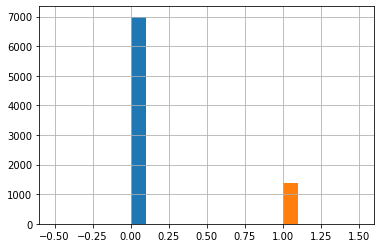

In [3]:
# read in the initial data
df_full = pd.read_csv('./Speed Dating Data.csv', encoding="ISO-8859-1") # use this encoding, funky error otherwise. thanks kagglers!
# show how Y is distributed at first
df_full.groupby("match").match.hist()

In [4]:
# only about 20% of dating partners are matched
pd.crosstab(index=df_full['match'],columns="count")

col_0,count
match,
0,6998
1,1380


## Cleaning
* Select attributes and drop NaN

In [5]:
idnum = ['iid','pid']
attributes = ['gender', 'age', 'field_cd', 'race', 'imprace', 'imprelig', 'from', 'date', 'go_out', 'career_c', 'sports', 'tvsports', 'exercise', 'dining', 'museums', 'art', 'hiking', 'gaming', 'clubbing', 'reading', 'tv', 'theater', 'movies', 'concerts', 'music', 'shopping', 'yoga', 'attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1', 'shar1_1', 'attr3_1', 'sinc3_1', 'intel3_1', 'fun3_1', 'amb3_1']
#attributes = ['gender', 'age', 'undergra', 'field', 'field_cd', 'race', 'imprace', 'imprelig', 'zipcode','from', 'income', 'date', 'go_out', 'career', 'career_c', 'sports', 'tvsports', 'exercise', 'dining', 'museums', 'art', 'hiking', 'gaming', 'clubbing', 'reading', 'tv', 'theater', 'movies', 'concerts', 'music', 'shopping', 'yoga', 'attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1', 'attr3_1', 'sinc3_1', 'intel3_1', 'fun3_1']
#attitudes = ['goal', 'exphappy', 'expnum'] # expnum too much null
attitudes = ['goal','exphappy']
label = ['match']

date = df_full[idnum+attributes+attitudes+label]
date.head()
print(date.shape)

# After dropna()
date = date.dropna().drop_duplicates()
print(date.shape)

(8378, 43)
(8124, 43)


* Change scale of _attr3_1_ etc from 1-10 to percentage 

In [6]:
# df_full = changeScale

# change scale of xxxx3_1
changeScale = date.copy()

needschange = [col for col in df_full.columns if '3_1' in col] # what you look for in the opposite sex
changeScale['sum_3'] = changeScale[needschange].sum(axis=1)
for i in range(len(needschange)):
    changeScale[needschange[i]] /= 0.01*changeScale['sum_3']
    
changeScale = changeScale.drop(columns=['sum_3'])
date = changeScale

* Concatenate two partners as a pair input

In [7]:
singleAttr = date.copy()
s1 = singleAttr[singleAttr.pid<singleAttr.iid].copy() # dupSingleAttr

s1.rename(columns={'iid' : 'pid', 'pid' : 'iid'}, inplace=True)

pairAttrs = singleAttr.merge(s1, on=['iid', 'pid'])  # merge two people as a feature pair
pairAttrs = pairAttrs.drop(columns=['match_y']).rename(columns={'match_x': 'match'})
pairAttrs['pid'] = pairAttrs['pid'].astype('int') 

pairDiff = pairAttrs.copy()

USA = ['Texas', 'Bowdoin College', 'Southern California', 'Palm Springs, California', '94115', 
       'Cincinnati, Ohio', 'Miami', 'Georgia, USA', 'New York', 'california', 'Washington DC', 
       'New Jersey', 'Ann Arbor, MI', 'new york', 'Iowa',  'California', 'Westchester, NY',
       'Washington, DC', 'Boston', 'new jersey', 'Michigan', 'Brandeis University', 'Cincinnati, OH', 
       'Los Angeles', 'San Francisco(home)/Los Angeles(undergrad)', 'Philadelphia', 'Houston', 'Brooklyn',
       'Florida', 'Tuscaloosa, Alabama', 'Albuquerque, NM',
       'Palo Alto, California', 'Boston, MA', 'Torrance, CA',
       'St. Louis, MO', 'Minnesota', 'Chicago', 'Ohio',
       'Washington State', 'Arizona', 'Minneapolis, MN', 'NJ', 'NY',
       'San Francisco', 'Long Island', 'Brooklyn, NY', 'Colorado', 'Ann Arbor', 'Philippines',
       'Milwaukee, Wisconsin', 'brooklyn ny', 'Long Island, NY', 'Memphis, TN', 'Louisiana', 'Maryland',
       'Staten Island', 'New York, NY', 'Massachusetts', 'Connecticut',
       'Pougkeepsie NY', 'PA', 'Cherry Hill, NJ', 'Minneapolis', 'NYC', 'Philadelphia, PA',
       'Atlanta, GA', 'Cleveland', 'NYC (Staten Island)','North Carolina', 'State College, PA', 'Detroit',
       'Washington DC Metro Region', 'colorado', 'Berkeley, CA',
       'Buffalo, NY', 'Pennsylvania', 'San Diego, CA',
       'Nebraska', 'Queens', 'Kansas', 'nyc', 'Atlanta', 'Los Angeles, CA', 'new york city',
       'Rochester, NY', 'Berkeley','Northern California', 'Silver Spring, MD', 'Vestal',
       'Texas & Boston', 'Cameroon', 'Bulgaria', 'New York City',
       'New York Area/ New Jersey', 'Baltimore', 'DC',
       'Germany', 'Wash DC (4 yrs)', 'Pittsburgh',
       'Detroit, Michigan, USA', 'J.P. Morgan', 'Virginia', 'Indiana',
       'lOS aNGELES', 'Wisconsin', 'Born in Montana, raised in South Jersey (nr. Philadelphia)',
       'Portland, Oregon', 'Seattle', 'Lexington, MA',
       'brooklyn, ny', 'Boulder, Colorado', 'Northern Virginia', 'I am from NYC',
       'Malaysia, then Massachusetts', 'Katonah, NY (more recently, Boston)',
       'Washington, D.C.','New Hope, PA', 'boston, ma', 'Las Vegas, Nevada',
       'UNCC', 'Northern New Jersey', 'NYC-6 yrs. Grew up in Nebraska',
       'France  / New York', 'Erie, PA', 'Westchester, new York',
       'USA/American', 'Great Neck, NY', 'California (West Coast)',
       'Portland, OR', 'New York/South Korea/Japan', 'Dallas, Texas', 'Palo Alto, CA',
       'WASHINGTON, D.C.', 'CALIFORNIA', 'Manhattan', 'atlanta, ga',
       'California and New York', 'Bronx Science', 'nashville, TN',
       'Midwest USA', 'los angeles','NYC, San Francisco', 'Oregon', 'San Francisco, CA',
       'Florida and Virginia', 'San Francisco Bay Area',
       'Hawaii and Los Angeles', 'Austin, TX', 'TN', 'Pittsburgh, PA', 'Hastings-on-Hudson, NY',
       'Burlington, Vermont', 'Santa Barbara, California',
       'Texas/London', 'CT, FL, TN', 'Detroit suburbs',
       'south carolina', 'California, New Jersey', 'alabama',
       'Westchester County, N.Y.', 'South Orange, New Jersey',
       'Boston, Ma', 'Kansas City, Missouri', 'Upstate New York', 'San Diego',
       'Hawaii', 'Salt Lake City', 'Saratoga, NY',
       'San Francisco/LA', 'India and NJ', 'London & New York']



**Attributes**
All attributes are in x and y (since we concatenate partner and partner)

Categorical variables include field, race, from, career_c
These variables should be one-hot encoded.

* gender: Female=0, Male=1
* age: numerical variable
* field: Law, Math, Social Sciences...
* race: Black/African American=1; European/Caucasian-American=2; Latino/Hispanic American=3; Asian/Pacific Islander/Asian-American=4; Native American=5; Other=6
* imprace: How important is it to you (on a scale of 1-10) that a person you date be of the same racial/ethnic background?
* imprelig: How important is it to you (on a scale of 1-10) that a person you date be of the same religious background?
* from: Where are you from originally? (specific location like Texas)
* date: In general, how frequently do you go on dates? 
    * Several times a week=1
    * Twice a week=2
	* Once a week=3
	* Twice a month=4
	* Once a month=5
	* Several times a year=6
	* Almost never=7
* go_out: How often do you go out (not necessarily on dates)?
	* Several times a week=1
	* Twice a week=2
	* Once a week=3
	* Twice a month=4
	* Once a month=5
	* Several times a year=6
	* Almost never=7
* career_c: career coded (1=Lawyer, 2=Academic/Research...)

**For the following variables, how interested are you in the following activities, 
on a scale of 1-10?**
* sports, tvsports, exercise, dining, museums, art, hiking, gaming, clubbing, reading, tv, theater, movies, concerts, music, shopping, yoga

**You have 100 points to distribute among the following attributes -- give more points to those attributes that are more important in a potential date, and fewer points to those attributes that are less important in a potential date.  Total points must equal 100.**
* We want to know what you look for in the opposite sex.
  * attr1_1: Attractive
  * sinc1_1: Sincere
  * intel1_1: Intelligent
  * fun1_1: Fun
  * amb1_1: Ambitious
* How do you think you measure up?
  * attr3_1: Attractive
  * sinc3_1: Sincere
  * intel3_1: Intelligent
  * fun3_1: Fun
  
* goal: what is your primary goal in participating in this event? 
  * Seemed like a fun night out=1
  * To meet new people=2
  * To get a date=3
  * Looking for a serious relationship=4
  * To say I did it=5
  * Other=6
  
**Our response variable - match: 0=No, 1=Yes**

## DATA MODEL 1: difference between partners

In [8]:
# hypothesize that similarity is a signficant predictor for whether partners match

# age difference (numerical)
pairDiff['ageDiff'] = (pairDiff['age_x'] - pairDiff['age_y']).abs()
#pairDiff.insert(2, 'ageDiff', pairDiff['age_x'] - pairDiff['age_y'])
pairDiff = pairDiff.drop('age_x', 1)
pairDiff = pairDiff.drop('age_y', 1)

# field_cd difference: n=same, y=different (categorical)
pairDiff['field_cDiff'] = np.where(pairDiff.field_cd_x==pairDiff.field_cd_y, 'n', 'y')
pairDiff = pairDiff.drop('field_cd_x', 1)
pairDiff = pairDiff.drop('field_cd_y', 1)

# race difference: n=same, y=different (categorical)
pairDiff['raceDiff'] = np.where(pairDiff.race_x==pairDiff.race_y, 'n', 'y')
pairDiff = pairDiff.drop('race_x', 1)
pairDiff = pairDiff.drop('race_y', 1)

# impraceDiff: how important is it that your partner has the same race as you (1-10 scale)? (numerical)
pairDiff['impraceDiff'] = (pairDiff['imprace_x'] - pairDiff['imprace_y']).abs()
pairDiff = pairDiff.drop('imprace_x', 1)
pairDiff = pairDiff.drop('imprace_y', 1)

# impreligDiff: how important is it that your partner has the same religion as you (1-10 scale)? (numerical)
pairDiff['impreligDiff'] = (pairDiff['imprelig_x'] - pairDiff['imprelig_y']).abs()
pairDiff = pairDiff.drop('imprelig_x', 1)
pairDiff = pairDiff.drop('imprelig_y', 1)

# fromDiff: whether two persons are from the same location? (categorical)
# The values in from_x and from_y is very diverse (not only countury, but college...), 
# thus we decide to group by country. Since most people are from the USA, we treats USA as the baseline.
# If both partners come from the United States, then they are from the same location.

pairDiff['fromDiff'] = np.where((pairDiff['from_x'].isin(USA) & pairDiff['from_y'].isin(USA)) 
                     | (pairDiff.from_x==pairDiff.from_y), 'n', 'y')
pairDiff = pairDiff.drop('from_x', 1)
pairDiff = pairDiff.drop('from_y', 1)

# dateDiff: how frequently do you go on date (1-7 scale)? (numerical)
pairDiff['dateDiff'] = (pairDiff['date_x'] - pairDiff['date_y']).abs()
pairDiff = pairDiff.drop('date_x', 1)
pairDiff = pairDiff.drop('date_y', 1)

# go_outDiff: how often do you go out (not necessarily on dates) (1-7 scale)? (numerical)
pairDiff['go_outDiff'] = (pairDiff['go_out_x'] - pairDiff['go_out_y']).abs()
pairDiff = pairDiff.drop('go_out_x', 1)
pairDiff = pairDiff.drop('go_out_y', 1)

# career_cDiff: career coded (categorical)
pairDiff['career_cDiff'] = np.where(pairDiff.career_c_x==pairDiff.career_c_y, 'n', 'y')
pairDiff = pairDiff.drop('career_c_x', 1)
pairDiff = pairDiff.drop('career_c_y', 1)

## Starting from sportsDiff to yogaDiff (numerical)
## difference in interest of the below activities (scale from 1-10)
# sportsDiff
pairDiff['sportsDiff'] = (pairDiff['sports_x'] - pairDiff['sports_y']).abs()
pairDiff = pairDiff.drop('sports_x', 1)
pairDiff = pairDiff.drop('sports_y', 1)

# tvsportsDiff
pairDiff['tvsportsDiff'] = (pairDiff['tvsports_x'] - pairDiff['tvsports_y']).abs()
pairDiff = pairDiff.drop('tvsports_x', 1)
pairDiff = pairDiff.drop('tvsports_y', 1)

# exerciseDiff
pairDiff['exerciseDiff'] = (pairDiff['exercise_x'] - pairDiff['exercise_y']).abs()
pairDiff = pairDiff.drop('exercise_x', 1)
pairDiff = pairDiff.drop('exercise_y', 1)

# diningDiff
pairDiff['diningDiff'] = (pairDiff['dining_x'] - pairDiff['dining_y']).abs()
pairDiff = pairDiff.drop('dining_x', 1)
pairDiff = pairDiff.drop('dining_y', 1)

# museumsDiff
pairDiff['museumsDiff'] = (pairDiff['museums_x'] - pairDiff['museums_y']).abs()
pairDiff = pairDiff.drop('museums_x', 1)
pairDiff = pairDiff.drop('museums_y', 1)

# artDiff
pairDiff['artDiff'] = (pairDiff['art_x'] - pairDiff['art_y']).abs()
pairDiff = pairDiff.drop('art_x', 1)
pairDiff = pairDiff.drop('art_y', 1)

# hikingDiff
pairDiff['hikingDiff'] = (pairDiff['hiking_x'] - pairDiff['hiking_y']).abs()
pairDiff = pairDiff.drop('hiking_x', 1)
pairDiff = pairDiff.drop('hiking_y', 1)

# gamingDiff
pairDiff['gamingDiff'] = (pairDiff['gaming_x'] - pairDiff['gaming_y']).abs()
pairDiff = pairDiff.drop('gaming_x', 1)
pairDiff = pairDiff.drop('gaming_y', 1)

# clubbingDiff
pairDiff['clubbingDiff'] = (pairDiff['clubbing_x'] - pairDiff['clubbing_y']).abs()
pairDiff = pairDiff.drop('clubbing_x', 1)
pairDiff = pairDiff.drop('clubbing_y', 1)

# readingDiff
pairDiff['readingDiff'] = (pairDiff['reading_x'] - pairDiff['reading_y']).abs()
pairDiff = pairDiff.drop('reading_x', 1)
pairDiff = pairDiff.drop('reading_y', 1)

# tvDiff
pairDiff['tvDiff'] = (pairDiff['tv_x'] - pairDiff['tv_y']).abs()
pairDiff = pairDiff.drop('tv_x', 1)
pairDiff = pairDiff.drop('tv_y', 1)

# theaterDiff
pairDiff['theaterDiff'] = (pairDiff['theater_x'] - pairDiff['theater_y']).abs()
pairDiff = pairDiff.drop('theater_x', 1)
pairDiff = pairDiff.drop('theater_y', 1)

# moviesDiff
pairDiff['moviesDiff'] = (pairDiff['movies_x'] - pairDiff['movies_y']).abs()
pairDiff = pairDiff.drop('movies_x', 1)
pairDiff = pairDiff.drop('movies_y', 1)

# concertsDiff
pairDiff['concertsDiff'] = (pairDiff['concerts_x'] - pairDiff['concerts_y']).abs()
pairDiff = pairDiff.drop('concerts_x', 1)
pairDiff = pairDiff.drop('concerts_y', 1)

# musicDiff
pairDiff['musicDiff'] = (pairDiff['music_x'] - pairDiff['music_y']).abs()
pairDiff = pairDiff.drop('music_x', 1)
pairDiff = pairDiff.drop('music_y', 1)

# shoppingDiff
pairDiff['shoppingDiff'] = (pairDiff['shopping_x'] - pairDiff['shopping_y']).abs()
pairDiff = pairDiff.drop('shopping_x', 1)
pairDiff = pairDiff.drop('shopping_y', 1)

# yogaDiff
pairDiff['yogaDiff'] = (pairDiff['yoga_x'] - pairDiff['yoga_y']).abs()
pairDiff = pairDiff.drop('yoga_x', 1)
pairDiff = pairDiff.drop('yoga_y', 1)

## Starting from attr1_1 to fun3_1 (numerical)
# attr1_1Diff
pairDiff['attr1_1Diff'] = (pairDiff['attr1_1_x'] - pairDiff['attr1_1_y']).abs()
pairDiff = pairDiff.drop('attr1_1_x', 1)
pairDiff = pairDiff.drop('attr1_1_y', 1)

# sinc1_1Diff
pairDiff['sinc1_1Diff'] = (pairDiff['sinc1_1_x'] - pairDiff['sinc1_1_y']).abs()
pairDiff = pairDiff.drop('sinc1_1_x', 1)
pairDiff = pairDiff.drop('sinc1_1_y', 1)

# intel1_1Diff
pairDiff['intel1_1Diff'] = (pairDiff['intel1_1_x'] - pairDiff['intel1_1_y']).abs()
pairDiff = pairDiff.drop('intel1_1_x', 1)
pairDiff = pairDiff.drop('intel1_1_y', 1)

# fun1_1Diff
pairDiff['fun1_1Diff'] = (pairDiff['fun1_1_x'] - pairDiff['fun1_1_y']).abs()
pairDiff = pairDiff.drop('fun1_1_x', 1)
pairDiff = pairDiff.drop('fun1_1_y', 1)

# amb1_1Diff
pairDiff['amb1_1Diff'] = (pairDiff['amb1_1_x'] - pairDiff['amb1_1_y']).abs()
pairDiff = pairDiff.drop('amb1_1_x', 1)
pairDiff = pairDiff.drop('amb1_1_y', 1)

# shar1_1Diff
pairDiff['shar1_1Diff'] = (pairDiff['shar1_1_x'] - pairDiff['shar1_1_y']).abs()
pairDiff = pairDiff.drop('shar1_1_x', 1)
pairDiff = pairDiff.drop('shar1_1_y', 1)

# attr3_1Diff
pairDiff['attr3_1Diff'] = (pairDiff['attr3_1_x'] - pairDiff['attr3_1_y']).abs()
pairDiff = pairDiff.drop('attr3_1_x', 1)
pairDiff = pairDiff.drop('attr3_1_y', 1)

# sinc3_1Diff
pairDiff['sinc3_1Diff'] = (pairDiff['sinc3_1_x'] - pairDiff['sinc3_1_y']).abs()
pairDiff = pairDiff.drop('sinc3_1_x', 1)
pairDiff = pairDiff.drop('sinc3_1_y', 1)

# intel3_1Diff
pairDiff['intel3_1Diff'] = (pairDiff['intel3_1_x'] - pairDiff['intel3_1_y']).abs()
pairDiff = pairDiff.drop('intel3_1_x', 1)
pairDiff = pairDiff.drop('intel3_1_y', 1)

# fun3_1Diff
pairDiff['fun3_1Diff'] = (pairDiff['fun3_1_x'] - pairDiff['fun3_1_y']).abs()
pairDiff = pairDiff.drop('fun3_1_x', 1)
pairDiff = pairDiff.drop('fun3_1_y', 1)

# amb3_1Diff
pairDiff['amb3_1Diff'] = (pairDiff['amb3_1_x'] - pairDiff['amb3_1_y']).abs()
pairDiff = pairDiff.drop('amb3_1_x', 1)
pairDiff = pairDiff.drop('amb3_1_y', 1)

# exphappyDiff
pairDiff['exphappyDiff'] = (pairDiff['exphappy_x'] - pairDiff['exphappy_y']).abs()
pairDiff = pairDiff.drop('exphappy_x', 1)
pairDiff = pairDiff.drop('exphappy_y', 1)

# goalDiff: what is your primary goal in participating in this event? (categorical)
pairDiff['goalDiff'] = np.where(pairDiff.goal_x==pairDiff.goal_y, 'n', 'y')
pairDiff = pairDiff.drop('goal_x', 1)
pairDiff = pairDiff.drop('goal_y', 1)

pairDiff = pairDiff.drop('iid', 1)
pairDiff = pairDiff.drop('pid', 1)
pairDiff = pairDiff.drop('gender_x', 1)
pairDiff = pairDiff.drop('gender_y', 1)

pairDiff
#pairDiff[['from_x','from_y']]
#pairDiff['from_x'].isin(USA)

# For one-hot encoding
pairDiff = pd.get_dummies(pairDiff)
pairDiff.columns
pairDiff.head()


,match,ageDiff,impraceDiff,impreligDiff,dateDiff,go_outDiff,sportsDiff,tvsportsDiff,exerciseDiff,diningDiff,...,field_cDiff_n,field_cDiff_y,raceDiff_n,raceDiff_y,fromDiff_n,fromDiff_y,career_cDiff_n,career_cDiff_y,goalDiff_n,goalDiff_y
0,0,4.0,6.0,2.0,0.0,3.0,7.0,6.0,4.0,1.0,...,0,1,1,0,0,1,0,1,1,0
1,0,1.0,0.0,0.0,4.0,0.0,8.0,6.0,3.0,1.0,...,1,0,1,0,0,1,1,0,1,0
2,0,1.0,2.0,4.0,2.0,0.0,6.0,7.0,4.0,2.0,...,1,0,0,1,1,0,1,0,0,1
3,1,0.0,0.0,0.0,1.0,0.0,9.0,5.0,2.0,1.0,...,1,0,1,0,1,0,1,0,0,1
4,0,1.0,2.0,0.0,1.0,0.0,8.0,6.0,3.0,0.0,...,1,0,0,1,1,0,1,0,1,0


### imbalanced-learn: SMOTENC

(array([3296.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
        3296.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

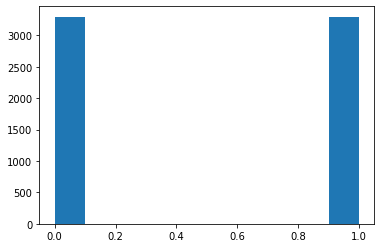

In [9]:
categ = np.array([col.endswith(('_n','_y')) for col in list(pairDiff.columns.values)])
yn = list(np.where(categ==True)[0]-1)  # find the indices of categorical features(cols) in X_train

smote_nc = SMOTENC(categorical_features=yn, random_state=123)
X = pairDiff.iloc[:, 1:].values
y = pairDiff['match'].values

# imbalanced learn
X, y = smote_nc.fit_resample(X, y)

# show how y distributed now
plt.hist(y)

In [10]:

# First split into training, test, and validation set

X_temp, X_test, y_temp, y_test = \
        train_test_split(X, y, test_size=0.2, 
                         shuffle=True, random_state=123, stratify=y)
X_train, X_valid, y_train, y_valid = \
        train_test_split(X_temp, y_temp, test_size=0.2,
                         shuffle=True, random_state=123, stratify=y_temp)
print('Train size', X_train.shape, 'class proportions', np.bincount(y_train))
print('Valid size', X_valid.shape, 'class proportions', np.bincount(y_valid))
print('Test size', X_test.shape, 'class proportions', np.bincount(y_test))


Train size (4218, 44) class proportions [2109 2109]
Valid size (1055, 44) class proportions [527 528]
Test size (1319, 44) class proportions [660 659]


### Logistic Regression

* **sequential_feature_selection**

**Partial code from professor’s demo**

In [10]:
# pipe.fit(X_train, y_train)
# print('Validation Accuracy %.2f%%' % (100*pipe.score(X_valid, y_valid)))
# print('Test Accuracy %.2f%%' % (100*pipe.score(X_test, y_test)))

# # coefficients for each predictor
# # we can see that all predictors have very small slope coefficients
# # LOVE is not something that is predictable by logistic regression!!
# lr_model = pipe.named_steps.logisticregression
# lr_model.coef_

# Using feature selection first -- Forward Sequential Search
# check how many number of features to select that give the best score
pipe = make_pipeline(StandardScaler(),
                     LogisticRegression(solver='newton-cg'))

# Feature selection
from mlxtend.feature_selection import SequentialFeatureSelector as SFS


sfs1 = SFS(pipe, 
           k_features=44, 
           forward=True, 
           floating=False, 
           verbose=2,
           scoring='accuracy',
           cv=10,
           n_jobs=-1)
sfs1 = sfs1.fit(X_train, y_train)

# print('Test Accuracy %.2f%%' % (100*pd.DataFrame(sfs1.get_metric_dict()).T.iloc[36, 0]))


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done  44 out of  44 | elapsed:    1.5s finished

[2019-12-18 01:48:29] Features: 1/44 -- score: 0.5599706612502822[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done  43 out of  43 | elapsed:    1.7s finished

[2019-12-18 01:48:31] Features: 2/44 -- score: 0.5979079214624237[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done  42 out of  42 | elapsed:    1.8s finished

[2019-12-18 01:48:33] Features: 3/44 -- score: 0.5979079214624237[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done  41 out o

[Parallel(n_jobs=-1)]: Done  13 out of  13 | elapsed:    1.7s finished

[2019-12-18 01:49:39] Features: 32/44 -- score: 0.6135590160234712[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of  12 | elapsed:    1.5s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed:    1.8s finished

[2019-12-18 01:49:41] Features: 33/44 -- score: 0.6140385917400136[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of  11 | elapsed:    1.5s remaining:    6.9s
[Parallel(n_jobs=-1)]: Done   8 out of  11 | elapsed:    1.6s remaining:    0.6s
[Parallel(n_jobs=-1)]: Done  11 out of  11 | elapsed:    1.8s finished

[2019-12-18 01:49:43] Features: 34/44 -- score: 0.6183039945836155[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    1.5s remaining:    0.7s
[Parallel(n_jobs=-1)]: Done  10 ou

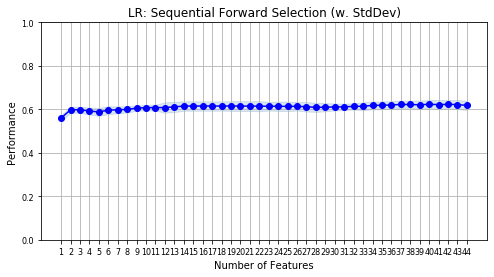

In [11]:

from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
fig1 = plot_sfs(sfs1.get_metric_dict(), kind='std_dev',figsize=(8,4))

plt.ylim([0, 1])
plt.title('LR: Sequential Forward Selection (w. StdDev)')
plt.tick_params(axis='both',which='major',labelsize=8)
plt.grid()
plt.show()



In [12]:
# Use the selected features from SFS:
pipe = make_pipeline(StandardScaler(),
                     LogisticRegression(solver='newton-cg'))
metric1 = DataFrame(sfs1.get_metric_dict()).T
select_idx1 = list(metric1[metric1['avg_score']==max(metric1['avg_score'])].feature_idx.values[0])

X_selected_1 = X_train[:,select_idx1].copy()
pipe.fit(X_selected_1, y_train)
X_select_val_1 = X_valid[:,select_idx1].copy()
X_select_test_1 = X_test[:,select_idx1].copy()
print('Training Accuracy %.2f%%' % (100*pipe.score(X_selected_1, y_train)))
print('Validation Accuracy %.2f%%' % (100*pipe.score(X_select_val_1, y_valid)))
print('Test Accuracy %.2f%%' % (100*pipe.score(X_select_test_1, y_test)))
lr_model = pipe.named_steps.logisticregression
lr_model.coef_

Training Accuracy 62.90%
Validation Accuracy 62.84%
Test Accuracy 63.00%


array([[-0.2118864 , -0.0946395 , -0.18129943, -0.04096617, -0.08911551,
         0.01258539,  0.06431981, -0.01831111, -0.04399852,  0.02088458,
        -0.08707545, -0.15234827, -0.04913604,  0.0029656 , -0.020216  ,
        -0.00757617, -0.00644931, -0.03376581,  0.04594954,  0.01288952,
        -0.02428055,  0.00235829,  0.00855415,  0.05905795,  0.01754071,
        -0.03183366, -0.08750168, -0.09518264, -0.08076131, -0.11374614,
        -0.04357534,  0.04357534, -0.07827996,  0.07827996,  0.02486951,
        -0.02486951, -0.09790743,  0.09790743, -0.14477008,  0.14477008]])

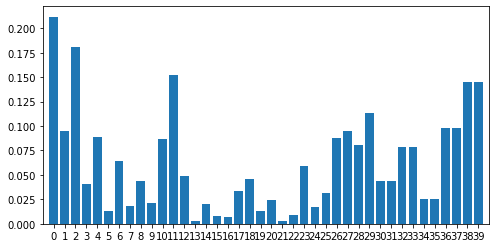

In [13]:
# # plot the predictors
fig, ax = plt.subplots(figsize=(8,4))
coefs = np.sum(np.abs(lr_model.coef_), axis=0)

ax.bar(range(X_selected_1.shape[1]), coefs)
ax.set_xlim([-1, X_selected_1.shape[1]])
ax.set_xticks(range(X_selected_1.shape[1]))

plt.show()

### Random Forest

In [14]:
# Load scikit's random forest classifier library
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import GridSearchCV

random_classifier = RandomForestClassifier()

parameters = { 'max_features':np.arange(35,45),'n_estimators':[100],'min_samples_leaf': [5,10,15,20,25]}

rf = GridSearchCV(random_classifier, parameters, cv = 5, error_score=0,
                    n_jobs=-1, verbose = 10)

# rf = RandomForestClassifier(n_jobs=500)
rf.fit(X_train, y_train)
p_train = rf.score(X_train, y_train)
p_test = rf.score(X_test, y_test)
print('Transf. training accuracy: %.2f%%' % (p_train * 100))
print('Transf. test accuracy: %.2f%%' % (p_test * 100))
print(rf.best_params_)


Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   16.4s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   21.2s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:   25.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   29.9s
[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed:   37.3s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:   44.4s
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:   51.7s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:   59.3s
[Parallel(n_jobs=-1)]: Done 129 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 165 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  1

Transf. training accuracy: 97.80%
Transf. test accuracy: 90.83%
{'max_features': 37, 'min_samples_leaf': 5, 'n_estimators': 100}


In [15]:
# Extract single tree
modelrf = RandomForestClassifier(max_features=43, min_samples_leaf= 5, n_estimators= 100)
modelrf.fit(X_train, y_train)
estimator = modelrf.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree1.dot', 
                feature_names = pairDiff.iloc[:, 1:].columns,
                class_names = str(pairDiff['match']),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree1.dot', '-o', 'tree1.png', '-Gdpi=600'])

# # Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree1.png')

In [11]:
from sklearn.model_selection import GridSearchCV

random_classifier_new = RandomForestClassifier(random_state=0)

parameters = {'max_features':np.arange(20,44),'n_estimators':[100, 200],'min_samples_leaf': [0.5, 1, 5],'ccp_alpha':[0.001, 0.0005]}
rf = GridSearchCV(random_classifier_new, parameters, cv = 5, error_score=0,
                    n_jobs=-1, verbose = 10)

# rf = RandomForestClassifier(n_jobs=500)
rf.fit(X_temp, y_temp)
p_train = rf.score(X_temp, y_temp)
p_test = rf.score(X_test, y_test)
print('Transf. training accuracy: %.2f%%' % (p_train * 100))
print('Transf. test accuracy: %.2f%%' % (p_test * 100))
print(rf.best_params_)

Fitting 5 folds for each of 288 candidates, totalling 1440 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   24.7s
[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed:   29.7s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:   37.9s
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:   44.1s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:   52.5s
[Parallel(n_jobs=-1)]: Done 129 tasks      | elapsed:   59.4s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 165 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  1

Transf. training accuracy: 99.11%
Transf. test accuracy: 91.21%
{'ccp_alpha': 0.0005, 'max_features': 35, 'min_samples_leaf': 1, 'n_estimators': 200}


In [12]:
modelrf = RandomForestClassifier(max_features=35, min_samples_leaf= 1, n_estimators=200, random_state=0, ccp_alpha=0.0005)
modelrf.fit(X_temp, y_temp)
p_train = modelrf.score(X_temp, y_temp)
p_test = modelrf.score(X_test, y_test)
print('Transf. training accuracy: %.2f%%' % (p_train * 100))
print('Transf. test accuracy: %.2f%%' % (p_test * 100))

Transf. training accuracy: 99.11%
Transf. test accuracy: 91.21%


In [13]:
from sklearn.metrics import precision_score, recall_score, roc_auc_score, roc_curve
# Open Source Tutorial: https://towardsdatascience.com/an-implementation-and-explanation-of-the-random-forest-in-python-77bf308a9b76
def evaluate_model(predictions, probs, train_predictions, train_probs):
    """Compare machine learning model to baseline performance.
    Computes statistics and shows ROC curve."""
    
    baseline = {}
    
    baseline['recall'] = recall_score(y_test, 
                                     [1 for _ in range(len(y_test))])
    baseline['precision'] = precision_score(y_test, 
                                      [1 for _ in range(len(y_test))])
    baseline['roc'] = 0.5
    
    results = {}
    
    results['recall'] = recall_score(y_test, predictions)
    results['precision'] = precision_score(y_test, predictions)
    results['roc'] = roc_auc_score(y_test, probs)
    
    train_results = {}
    train_results['recall'] = recall_score(y_temp, train_predictions)
    train_results['precision'] = precision_score(y_temp, train_predictions)
    train_results['roc'] = roc_auc_score(y_temp, train_probs)
    
    for metric in ['recall', 'precision', 'roc']:
        print(f'{metric.capitalize()} Baseline: {round(baseline[metric], 2)} Test: {round(results[metric], 2)} Train: {round(train_results[metric], 2)}')
    
    # Calculate false positive rates and true positive rates
    base_fpr, base_tpr, _ = roc_curve(y_test, [1 for _ in range(len(y_test))])
    model_fpr, model_tpr, _ = roc_curve(y_test, probs)

    plt.figure(figsize = (8, 6))
    plt.rcParams['font.size'] = 16
    
    # Plot both curves
    plt.plot(base_fpr, base_tpr, 'b', label = 'baseline')
    plt.plot(model_fpr, model_tpr, 'r', label = 'model')
    plt.legend();
    plt.xlabel('False Positive Rate'); 
    plt.ylabel('True Positive Rate'); plt.title('ROC Curves');
    plt.show();
    

Recall Baseline: 1.0 Test: 0.82 Train: 0.98
Precision Baseline: 0.5 Test: 1.0 Train: 1.0
Roc Baseline: 0.5 Test: 0.96 Train: 1.0


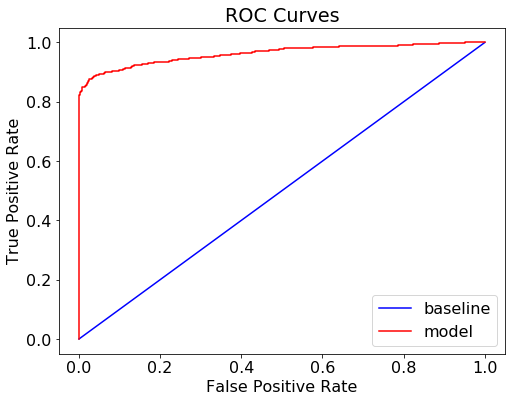

<Figure size 432x288 with 0 Axes>

In [14]:
# Training predictions
train_rf_pred = modelrf.predict(X_temp)
train_rf_probs = modelrf.predict_proba(X_temp)[:, 1]

# Testing predictions
rf_pred = modelrf.predict(X_test)
rf_probs = modelrf.predict_proba(X_test)[:, 1]

evaluate_model(rf_pred, rf_probs, train_rf_pred, train_rf_probs)
plt.savefig('roc_auc_curve.png')

### XGBoost

In [20]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV

In [21]:
xgbclf = xgb.XGBClassifier(colsample_bytree = 0.3, seed=123)
parameters = {
    'objective':['binary:logistic', 'binary:hinge'],
    'max_depth': range (4,8,1),
    'n_estimators': [50,100,200],
    'learning_rate': [0.1, 0.01],
    'reg_lambda': [0.5,0.1],
    'alpha': [1,5]
}
grid_search = GridSearchCV(
    estimator=xgbclf,
    param_grid=parameters,
    scoring = 'roc_auc',
    n_jobs = -1,
    cv = 5
)
grid_search.fit(X_temp, y_temp)
grid_search.best_estimator_

XGBClassifier(alpha=1, base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.3, gamma=0,
              learning_rate=0.01, max_delta_step=0, max_depth=7,
              min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1, seed=123,
              silent=None, subsample=1, verbosity=1)

In [22]:
p_train = grid_search.score(X_temp, y_temp)
p_test = grid_search.score(X_test, y_test)
print('Transf. training accuracy: %.2f%%' % (p_train * 100))
print('Transf. test accuracy: %.2f%%' % (p_test * 100))

Transf. training accuracy: 99.65%
Transf. test accuracy: 94.37%


### SVM

In [17]:
from sklearn import svm
from sklearn.svm import SVC

* sfs

In [21]:
scaler = StandardScaler()
X_train_scl = scaler.fit_transform(X_train) 
X_valid_scl = scaler.transform(X_valid)
X_temp_scl = scaler.transform(X_temp)
X_test_scl = scaler.transform(X_test)

In [22]:
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
svm_clf = svm.SVC(kernel='rbf',gamma='auto',probability=True)
sfs2 = SFS(svm_clf,
           k_features=44, 
           forward=True, 
           floating=False, 
           verbose=2,
           scoring='accuracy',
           cv=5,
           n_jobs=-1)
sfs2 = sfs2.fit(X_temp_scl, y_temp)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  44 out of  44 | elapsed:  1.4min finished

[2019-12-18 07:39:43] Features: 1/44 -- score: 0.6576943622579746[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  43 out of  43 | elapsed:  1.4min finished

[2019-12-18 07:41:10] Features: 2/44 -- score: 0.6112312382528307[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  42 out of  42 | elapsed:  1.4min finished

[2019-12-18 07:42:35] Features: 3/44 -- score: 0.6205242947201812[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   59.2s
[Parallel(n_jobs=-1)]: Done  41 out o

[Parallel(n_jobs=-1)]: Done  13 out of  13 | elapsed:  1.0min finished

[2019-12-18 08:26:27] Features: 32/44 -- score: 0.8435457791127459[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of  12 | elapsed:   38.0s remaining:  1.3min
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed:   58.5s finished

[2019-12-18 08:27:26] Features: 33/44 -- score: 0.8456328857792925[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of  11 | elapsed:   39.0s remaining:  2.9min
[Parallel(n_jobs=-1)]: Done   8 out of  11 | elapsed:   39.4s remaining:   14.8s
[Parallel(n_jobs=-1)]: Done  11 out of  11 | elapsed:   58.6s finished

[2019-12-18 08:28:24] Features: 34/44 -- score: 0.8450621869295036[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:   39.9s remaining:   17.1s
[Parallel(n_jobs=-1)]: Done  10 ou

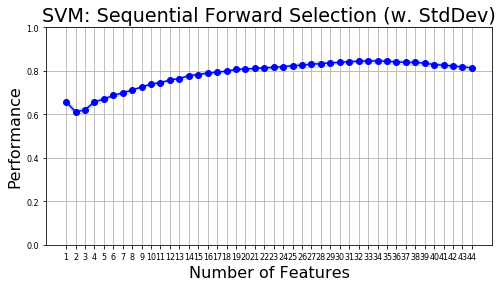

In [23]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
fig2 = plot_sfs(sfs2.get_metric_dict(), kind='std_dev',figsize=(8,4))

plt.ylim([0, 1])
plt.title('SVM: Sequential Forward Selection (w. StdDev)')
plt.tick_params(axis='both',which='major',labelsize=8)
plt.grid()
plt.show()

In [24]:
metric2 = DataFrame(sfs2.get_metric_dict()).T
select_idx2 = list(metric2[metric2['avg_score']==max(metric2['avg_score'])].feature_idx.values[0])
select_feat2 = pairDiff.columns.values[list(np.array(select_idx2)+1)]

In [25]:
dropped_feat2 = sorted(list(set(pairDiff.columns.values).difference(set(select_feat2))))
dropped_feat2.remove('match')
DataFrame(dropped_feat2).T

,0,1,2,3,4,5,6,7,8,9,10
0,career_cDiff_n,career_cDiff_y,exerciseDiff,field_cDiff_n,field_cDiff_y,fromDiff_n,fromDiff_y,goalDiff_n,goalDiff_y,intel1_1Diff,raceDiff_y


In [28]:
X_selected_2= X_temp_scl[:,select_idx2].copy()
svm_clf.fit(X_selected_2, y_temp)
#X_select_val_2 = X_valid_scl[:,select_idx2].copy()
X_select_test_2= X_test_scl[:,select_idx2].copy()
print('Training Accuracy %.2f%%' % (100*svm_clf.score(X_selected_2, y_temp)))
print('Test Accuracy %.2f%%' % (100*svm_clf.score(X_select_test_2, y_test)))


Training Accuracy 92.74%
Test Accuracy 86.13%


* grid search cv

In [29]:
from sklearn.model_selection import GridSearchCV
clf = svm.SVC(gamma='auto',probability=True)
parameters = {'kernel':('linear', 'rbf'), 'C':[0.5, 1]}
gs_svm = GridSearchCV(clf, parameters, cv = 5, error_score=0,
                    n_jobs=-1, verbose = 10)

# apply to data 
gs_svm.fit(X_temp, y_temp) 
print(gs_svm.best_params_)

gs_svm_acc_train1 = gs_svm.score(X_temp, y_temp)
gs_svm_acc_test1 = gs_svm.score(X_test, y_test)
# svm_clf.predict(X_test)
print('Training accuracy: %.2f%%' % (gs_svm_acc_train1 * 100))
print('Test accuracy: %.2f%%' % (gs_svm_acc_test1 * 100))

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done   8 out of  20 | elapsed:   42.1s remaining:  1.1min
[Parallel(n_jobs=-1)]: Done  11 out of  20 | elapsed:   54.0s remaining:   44.2s
[Parallel(n_jobs=-1)]: Done  14 out of  20 | elapsed:  1.1min remaining:   27.9s
[Parallel(n_jobs=-1)]: Done  17 out of  20 | elapsed:  1.4min remaining:   14.5s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  1.6min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  1.6min finished


{'C': 1, 'kernel': 'rbf'}
Training accuracy: 100.00%
Test accuracy: 97.50%
